In [2]:
!git clone https://github.com/Abdulrasheed1729/xai.git

Cloning into 'xai'...
remote: Enumerating objects: 71, done.
remote: Counting objects: 100% (71/71), done.
remote: Compressing objects: 100% (57/57), done.
remote: Total 71 (delta 23), reused 55 (delta 11), pack-reused 0 (from 0)
Receiving objects: 100% (71/71), 14.97 MiB | 18.03 MiB/s, done.
Resolving deltas: 100% (23/23), done.


In [3]:
import pandas as pd
import numpy as np
import random

import matplotlib.pyplot as plt

import seaborn as sns
import xgboost as xgb

from sklearn.metrics import r2_score, mean_squared_error
from sklearn.utils import resample
from sklearn import metrics
from sklearn.datasets import make_classification
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score, log_loss

In [4]:
df = pd.read_csv('xai/data/titanic_data.csv')

In [5]:
df = df[["pclass","sex","age","survived"]]
df.dropna(inplace=True)

In [6]:
mapping = {"female": 0, "male": 1}
df["sex"] = df["sex"].map(mapping)

In [7]:
X_data = df[['pclass', 'sex', 'age']].values
y_data = df['survived'].values
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.3)

In [8]:
df.head()

,pclass,sex,age,survived
0,3,1,22.0,0
1,1,0,38.0,1
2,3,0,26.0,1
3,1,0,35.0,1
4,3,1,35.0,0


In [9]:
features = df.columns

In [10]:
def accuracy(true_values, predictions):
    return np.mean(true_values == predictions)

Accuracy:  0.7627906976744186
Precision:  0.6823529411764706
Sensitivity / recall:  0.7073170731707317


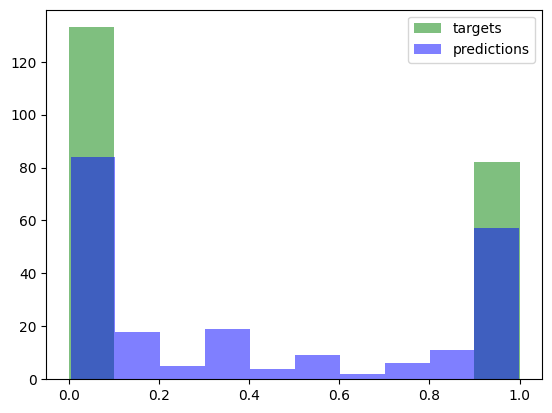

In [11]:
model = xgb.XGBClassifier()
model.fit(X_train, y_train)

# Predict and evaluate model
predictions = model.predict(X_test)
print("Accuracy: ", accuracy(y_test, predictions))
print("Precision: ", metrics.precision_score(y_test, predictions))
print("Sensitivity / recall: ", metrics.recall_score(y_test, predictions))

probs  = model.predict_proba(X_test)[:,1]

plt.hist(y_test, color="green", alpha=0.5, label="targets")
plt.hist(probs, color="blue", alpha=0.5, label="predictions")
plt.legend()
plt.show()

In [12]:
y_surr = model.predict(X_train)

In [13]:
surr_model = LogisticRegression()

In [14]:
surr_model.fit(X_train, y_surr)

LogisticRegression()

In [15]:
def niceprint(l):
    gender = "male" if l[1] == 1 else "female"
    print("Pclass\t|     Gender\t|\tAge\t|")
    print(f"{l[0]} \t|     {gender}\t|\t{l[2]}\t|")

In [16]:
X_paul = [2, 1, 25]
pred_paul = model.predict_proba([X_paul])
print("Paul:")
niceprint(X_paul)
print(f"Chance for survival: {pred_paul[0][1]}\n")

Paul:
Pclass	|     Gender	|	Age	|
2 	|     male	|	25	|
Chance for survival: 0.04647490009665489



In [17]:
X_paul = [2, 1, 25]
pred_paul = surr_model.predict_proba([X_paul])
print("Paul:")
niceprint(X_paul)
print(f"Chance for survival: {pred_paul[0][1]}\n")

Paul:
Pclass	|     Gender	|	Age	|
2 	|     male	|	25	|
Chance for survival: 0.17878743688810916



In [1]:
import numpy as np
import pandas as pd
import optuna
from sklearn.preprocessing import MinMaxScaler
import xgboost

from utils import encode_features, get_train_test_data, train_model, evaluate_model, generate_individual, epsilon_rounding, get_relevant_candidates

optuna.logging.set_verbosity(optuna.logging.WARNING)

## Data

In [1]:
def load_data(data_filepath="../data/Loan_data_extracted.csv"):
    """
    Input: path to .csv data file
    
    TODO: specify in feature_info whether features are of type:
        fixed, meaning cannot change for the counterfactual
        unique, meaning can only take existing categorical values
        increase, meaning their value can only increase and not decrease
        range, meaning their new value can take a range of values

    Returns:
        dataframe and feature configuration dictionary
    """
    df = pd.read_csv(data_filepath)
    df = df.drop('Loan_ID', axis=1)
    df = df.dropna()
    
    feature_config = {
        "categorical": ["Gender", "Married", "Education", "Self_Employed", "Property_Area", "Loan_Status"],
    
        "feature_info": [
            ('Gender', 'todo'),
            ('Married', 'todo'),
            ('Dependents', 'todo'),
            ('Education', 'todo'),
            ('Self_Employed', 'todo'),
            ('ApplicantIncome', 'todo'),
            ('CoapplicantIncome', 'todo'),
            ('LoanAmount', 'todo'),
            ('Loan_Amount_Term', 'todo'),
            ('Credit_History', 'todo'),
            ('Property_Area', 'todo'),
        ],
    
        "categorical_features": ["Gender", "Married", "Education", "Self_Employed", "Property_Area"]
    }

    return df, feature_config

## Model

In [4]:
# Load the model from the saved file
model = xgboost.XGBClassifier()
model.load_model("xgboost_model.json")

## TODO: Code for counterfactual search

In [2]:
def misfit(x_prime, y_target, model):
    """
    Optimisation criterion 1
    Calculate absolute difference between y_target and y_prime_prediction.
    """
    
    #TODO
    y_prime_prediction = model.predict(x_prime)
    
    return np.abs(y_target - y_prime_prediction)

In [3]:
def distance(X, x, x_prime, numerical, categorical):
    """
    Optimisation criterion 2
    Calculate distance between x_prime and x.
    """
    # Normalize data
    scaler = MinMaxScaler()
    scaler.fit(X[numerical])
    x_normalized = scaler.transform(x[numerical])
    x_prime_normalized = scaler.transform(x_prime[numerical])
        
    # Compute distances
    #TODO
    distance = []

    if numerical:
        dist = np.abs(x_normalized - x_prime_normalized)
        distance.extend(dist)
    if categorical:
        for category in categorical:
            d = 0 if x_prime[category] == x[category] else 1
            distance.append(d)
        
    return np.mean(distance)

In [4]:
def sparsity(x, x_prime):
    """
    Optimisation criterion 3
    Return number of unchanged features.
    """
    #TODO
    mask = x != x_prime
    
    return np.sum(mask)

In [ ]:
def closest_real(X, x_prime, categorical, numerical):
    """
    Optimisation criterion 4
    Return the minimum distance between x_prime and any point in X.
    """
    scaler = MinMaxScaler()
    X_normalized = scaler.fit_transform(X[numerical])
    x_prime_normalized = scaler.transform(x_prime[numerical])
    
    # Compute total distance
    #TODO
    
    return

In [ ]:
def objective(trial, X, x, features, model, y_target, numerical, categorical):
    x_prime = x.copy()
    for feature in features:
        feature.sample(trial)
        x_prime[feature.name] = feature.value
    epsilon_rounding(x, x_prime, 1e-1)

    obj1 = misfit(x_prime, y_target, model)
    obj2 = distance(X, x, x_prime, numerical, categorical)
    obj3 = sparsity(x, x_prime)
    obj4 = closest_real(X, x_prime, categorical, numerical)

    return obj1, obj2, obj3, obj4

In [ ]:
def get_counterfactuals(X, x, y_target, model, 
                        numerical, categorical, features, 
                        tol, optimization_steps, timeout):

    study = optuna.create_study(directions=['minimize', 'minimize', 'maximize', 'minimize'], 
                                sampler=optuna.samplers.NSGAIISampler(seed=42)) 
    
    study.optimize(lambda trial: objective(trial, X, x, features, model, 
                                           y_target, 
                                           numerical, 
                                           categorical), 
                   n_trials=optimization_steps, 
                   timeout=timeout)
    
    candidates_df = get_relevant_candidates(study, x, model, y_target, tol)
    
    return candidates_df

## Provided datapoint and data

In [5]:
X_obs, feat_conf = load_data("../data/Loan_data_extracted.csv")
X_obs = encode_features(X_obs, feat_conf["categorical"])

--- 
Encoded categorical features as follows:
Gender :  {'Female': 0, 'Male': 1}
Married :  {'No': 0, 'Yes': 1}
Education :  {'Not Graduate': 0, 'Graduate': 1}
Self_Employed :  {'No': 0, 'Yes': 1}
Property_Area :  {'Rural': 0, 'Semiurban': 1, 'Urban': 2}
Loan_Status :  {'N': 0, 'Y': 1}
---


In [6]:
customer = np.array([0,1,0,0,0,2000,1500,1000,480,0,1])
x = pd.DataFrame([customer], columns=X_obs.columns[:-1].tolist())

In [ ]:
x

In [ ]:
# Check that our customer x did not get the loan

# TODO

# and help her find out what she has to do in order to get the loan
# If you have implemented everything above correctly, the code below
# will find the counterfactuals

## Search for counterfactuals

In [ ]:
# Make a list of Feature objects containing information about how 
# each feature is allowed to change when generating counterfactuals
change_features = generate_individual(X_obs, x, feat_conf["feature_info"])

In [ ]:
# Set the desired new model prediction
y_CF = 0.7
print(f"Searching for counterfactuals with y_CF = {y_CF}...\n")
numerical_features = [x for x in df.columns if x not in feat_conf["categorical"]]
CFS = get_counterfactuals(X_obs, x, y_CF, model, 
                          numerical_features, 
                          feat_conf["categorical_features"], 
                          change_features, 
                          tol=0.05, 
                          optimization_steps=500, 
                          timeout=None) 

In [ ]:
x

In [ ]:
CFS

In [1]:
!git clone https://github.com/Abdulrasheed1729/xai.git

Cloning into 'xai'...
remote: Enumerating objects: 48, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 48 (delta 13), reused 42 (delta 7), pack-reused 0 (from 0)
Receiving objects: 100% (48/48), 6.93 MiB | 8.64 MiB/s, done.
Resolving deltas: 100% (13/13), done.


In [3]:
!pip install lime --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 13.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [4]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns #conda install seaborn
import matplotlib.pyplot as plt
import xgboost
from IPython.display import display, HTML # conda install ipython
from lime.lime_tabular import LimeTabularExplainer
# Depending on conda environment, conda install -c conda-forge lime  OR pip install lime

# Data

#### First, get the .csv file containing the titanic data from https://calmcode.io/static/data/titanic.csv

In [5]:
df = pd.read_csv('xai/data/titanic_data.csv')
df = df[["pclass","sex","age","survived"]]
df.dropna(inplace=True)

features = df.columns

# Column sex is type string. Encode it to numerical
mapping = {"female": 0, "male": 1}
df["sex"] = df["sex"].map(mapping)

# Train test split
X_data = df[['pclass', 'sex', 'age']].values
y_data = df['survived'].values
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.3)

# Models

In [6]:
def accuracy(true_values, predictions):
    return np.mean(true_values == predictions)

In [7]:
classifier = xgboost.XGBClassifier()
classifier.fit(X_train, y_train)

probs = classifier.predict(X_test)

print("Model accuracy: ", accuracy(y_test, probs))

Model accuracy:  0.7906976744186046


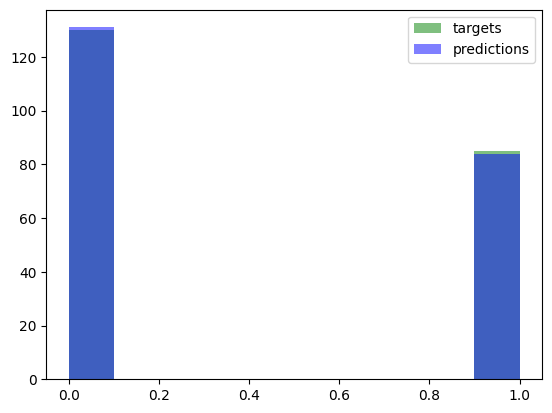

In [8]:
plt.hist(y_test, color="green", alpha=0.5, label="targets")
plt.hist(probs, color="blue", alpha=0.5, label="predictions")
plt.legend()
plt.show()

In [9]:
regressor = xgboost.XGBRegressor(random_state=50)
regressor.fit(X_train, y_train)
probs = regressor.predict(X_test)
classes = [0 if _p<0.5 else 1 for _p in probs]
print("Model accuracy: ", accuracy(y_test, classes))

Model accuracy:  0.7767441860465116


# LIME

In [10]:
# Instantiate explainer objects
lime_regressor = LimeTabularExplainer(X_train,
                                        feature_names=features,
                                        verbose=True,
                                        mode='regression')

lime_classifier = LimeTabularExplainer(X_train,
                                        feature_names=features,
                                        verbose=True,
                                        mode='classification')

In [11]:
X_jack = np.array([3,1,21])
X_rose = np.array([1,0,17])

arguments to the explain_instance method:
1) feature values of data point to explain
2) prediction function (of the model to explain)
3) top features to include

In [12]:
exp_lime = lime_classifier.explain_instance(X_jack, classifier.predict_proba, num_features=3)

#exp_lime.show_in_notebook()
# Workaround with same kwargs as show_in_notebook
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.7794346909245806
Prediction_local [0.23731841]
Right: 0.016948877


In [13]:
exp_lime = lime_regressor.explain_instance(X_jack, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.7937586773719498
Prediction_local [0.26508977]
Right: -0.0008515233


Interpreting the output:


Intercept: the constant in the linear model’s prediction for the test array

Prediction_local: surrogate model prediction, trained on the perturbed samples* using LIME’s top k features

Right: full model prediction for the test array

Visualisations: blue = negative; orange = positive contributions

*obtained by sampling around the test vector following a normal distribution

In [14]:
exp_lime = lime_classifier.explain_instance(X_rose, classifier.predict_proba, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.13768591252675266
Prediction_local [1.06811108]
Right: 0.9973846


In [15]:
exp_lime = lime_regressor.explain_instance(X_rose, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.14587919621074213
Prediction_local [1.10168732]
Right: 1.0242646


In [16]:
X_kid = np.array([3, 0, 16])
regressor.predict([X_kid])

array([0.6704679], dtype=float32)

In [17]:
exp_lime = lime_regressor.explain_instance(X_kid, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.3854660494473696
Prediction_local [0.66475511]
Right: 0.6704679


In [18]:
X_kid = np.array([3, 1, 9])
regressor.predict([X_kid])

array([0.00050275], dtype=float32)

In [19]:
exp_lime = lime_regressor.explain_instance(X_kid, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.8082322238647374
Prediction_local [0.26070248]
Right: 0.00050274737


In [1]:
!git clone https://github.com/Abdulrasheed1729/xai.git

Cloning into 'xai'...
remote: Enumerating objects: 94, done.
remote: Counting objects: 100% (94/94), done.
remote: Compressing objects: 100% (77/77), done.
remote: Total 94 (delta 30), reused 68 (delta 12), pack-reused 0 (from 0)
Receiving objects: 100% (94/94), 16.48 MiB | 14.33 MiB/s, done.
Resolving deltas: 100% (30/30), done.


In [2]:
!pip install lime --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [3]:
import random, ast
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
from torchvision import models, transforms
import os

from PIL import Image
from lime import lime_image
from skimage.segmentation import mark_boundaries

In [4]:
print(torch.__version__, torchvision.__version__)

2.9.0+cpu 0.24.0+cpu


See info and class indices at
https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/


In [5]:
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 127MB/s]


# Classification function for LIME

Define the classification function LIME needs.
Input: numpy array of images where each image is ndarray of shape (channel, height, width).
Output: numpy array of shape (image index, classes) where each value in array should be probability for that image, class combination.

In [6]:
def prediction_function(images):
    model.eval()
    images_transformed = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)

    device = "cuda" if torch.cuda.is_available() else "cpu"
    model.to(device)
    model.eval()

    logits = model(images_transformed)
    preds = logits.softmax(dim=1)
    return preds.detach().cpu().numpy()

# Image loading and preprocessing

In [7]:
with open("xai/LIME/imagenet1000_clsidx_to_labels.txt", "r", encoding="utf-8") as f:
    text = f.read()
labels_dict = ast.literal_eval(text)

In [8]:
def get_image(path):
    with open(os.path.abspath(path), 'rb') as f:
        with Image.open(f) as img:
            return img.convert('RGB')


def get_pil_transform():
    transf = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224)
    ])

    return transf

def get_preprocess_transform():
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])
    transf = transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])

    return transf

pill_transf = get_pil_transform()
preprocess_transform = get_preprocess_transform()

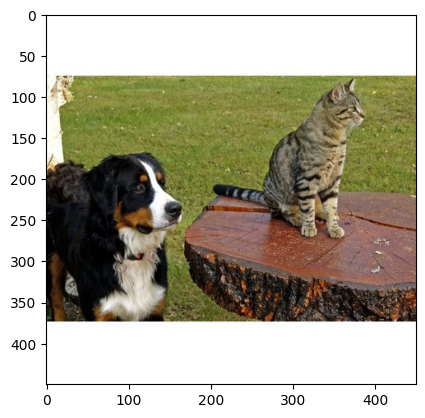

In [9]:
img = get_image('xai/data/cat_dog.png')
plt.imshow(img)
plt.show()

# LIME

In [10]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         # number of labels (with highest prob) to show
                                         top_labels=5,
                                         # size of the neighborhood to learn the linear model
                                         num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [11]:
explanation.top_labels

[np.int64(240), np.int64(239), np.int64(241), np.int64(238), np.int64(281)]

In [12]:
top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

['Appenzeller', 'Bernese mountain dog', 'EntleBucher', 'Greater Swiss Mountain dog', 'tabby, tabby cat']


Overlay the mask on from LIME on the image to see which areas encourage the top prediction

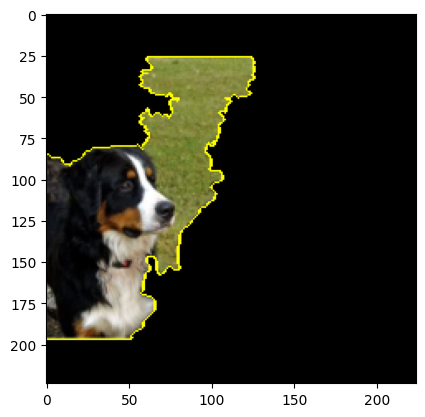

In [13]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                              # only include superpixels contributing positively
                                             positive_only=True,
                                             # number of superpixels to show
                                             num_features=6,
                                             # turn off the non-explanation part
                                             hide_rest=True)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

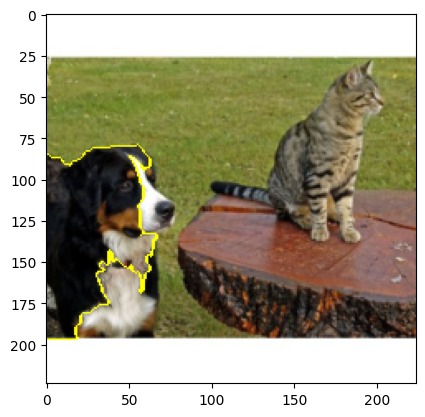

In [14]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                              # only include superpixels contributing positively
                                             positive_only=True,
                                             # number of superpixels to show
                                             num_features=3,
                                             # turn off the non-explanation part
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

Display areas also areas that contribute against the top prediction.

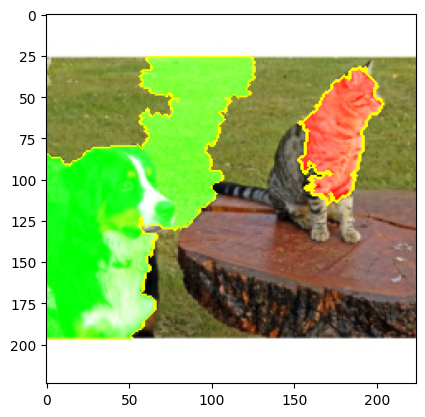

In [15]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                                         positive_only=False,
                                                         negative_only=False,
                                                         num_features=7,
                                                         hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

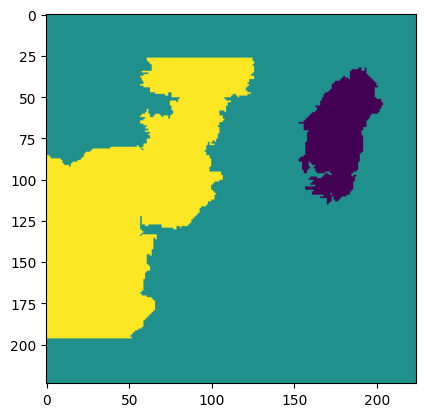

In [16]:
plt.imshow(mask)
plt.show()

In [17]:
np.unique(np.array(mask))

array([-1,  0,  1])

## Other images

  0%|          | 0/1000 [00:00<?, ?it/s]

['tench, Tinca tinca', 'bolete', 'armadillo', 'isopod', 'mud turtle']


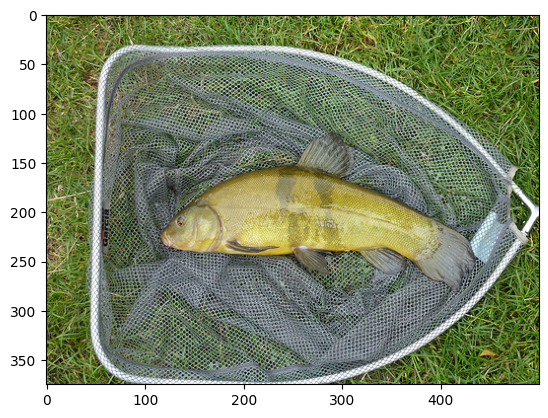

In [18]:
img = get_image('xai/data/fish.jpg')
plt.imshow(img)

explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         top_labels=5,
                                         num_samples=1000)

top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

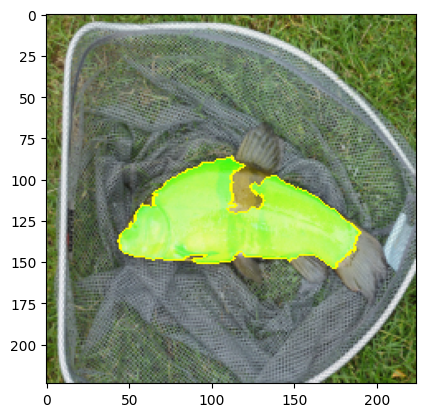

In [19]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0],
                                             positive_only=False,
                                             num_features=3,
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

['coral reef', 'scuba diver', 'rock beauty, Holocanthus tricolor', 'jellyfish', 'anemone fish']


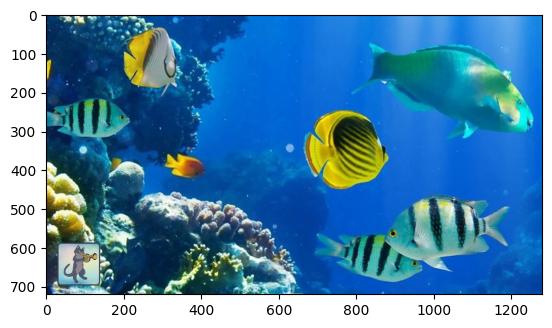

In [20]:
img = get_image('xai/data/aquarium.jpg')
plt.imshow(img)

explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         top_labels=5,
                                         num_samples=1000)

top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

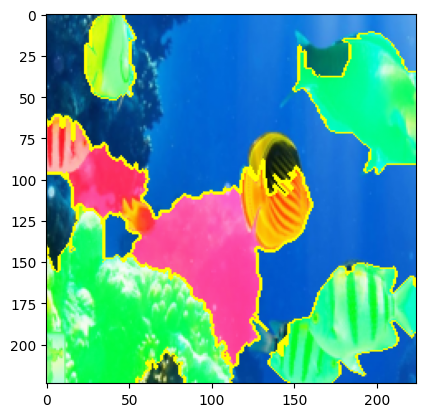

In [21]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0],
                                             positive_only=False,
                                             num_features=10,
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

## Your own picture

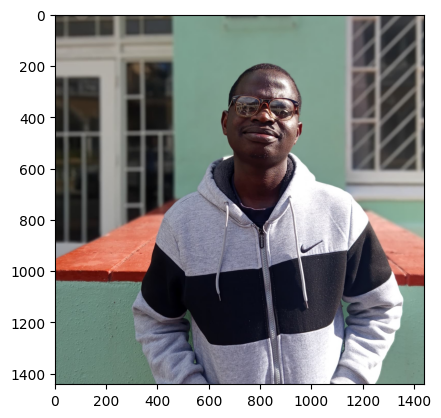

In [22]:
img = get_image('xai/rasheed.png')
plt.imshow(img)
plt.show()

In [23]:
top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

['coral reef', 'scuba diver', 'rock beauty, Holocanthus tricolor', 'jellyfish', 'anemone fish']


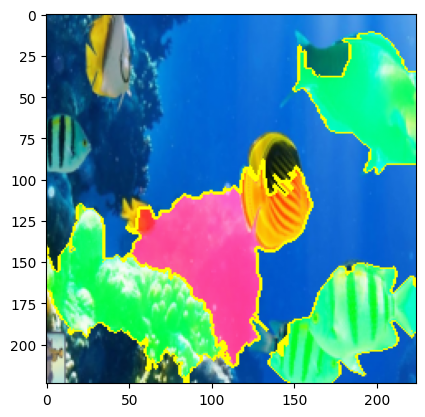

In [24]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0],
                                             positive_only=False,
                                             num_features=6,
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

In [3]:
!pip install dcor --quiet

In [5]:
from itertools import combinations
import numpy as np
import pandas as pd
from sklearn.datasets import load_diabetes
import seaborn as sns
import matplotlib.pyplot as plt
import dcor # pip install dcor
import xgboost
from sklearn.model_selection import train_test_split
import math

In [6]:
def calc_shapley_value(player_index, all_players, cf_dict):
    """
    Calculate the Shapley value for player index
    Input:
        all_players, list of player indices
        cf_dict, dictionary containing characteristic function values for all players
    """
    players = all_players.copy()

    if player_index in players:
        players.remove(player_index)

    #TODO

    n = len(all_players)
    shapley_value = 0.0

    for coalition_size in range(n):
        for coalition in combinations(players, coalition_size):
            coalition = tuple(sorted(coalition))

            coalition_with_player = tuple(sorted(coalition + (player_index,)))

            v_S = cf_dict.get(coalition, 0.0)
            v_S_union_i = cf_dict.get(coalition_with_player, 0.0)

            marginal_contribution = v_S_union_i - v_S

            s = len(coalition)
            weight = (math.factorial(s) * math.factorial(n - s - 1)) / math.factorial(n)

            shapley_value += weight * marginal_contribution

    return shapley_value #TODO

# The Shapley decomposition

### Cab sharing 1

In [7]:
players = [1,2,3]
cf_dict = {():0, (1,):3, (2,):7, (3,):10,
           (1,2):7, (1,3):10, (2,3):10,
           (1,2,3):10}

print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))

1.0
2.9999999999999996
6.0


### Cab sharing 2

In [8]:
players = [1,2,3,4]
cf_dict = {():0, (1,):0, (2,):3, (3,):3, (4,):7,
           (1,2):3, (1,3):3, (1,4):7, (2,3):3, (2,4):7, (3,4):7,
           (1,2,3):3, (1,2,4):7, (1,3,4):7, (2,3,4):7,
           (1,2,3,4):7}

print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))
print(calc_shapley_value(4, players, cf_dict))

0.0
1.0
1.0
5.0


### Cat and mice

In [9]:
players = [1,2,3]
cf_dict = {():0, (1,):2, (2,):4, (3,):5, (1,2):3, (1,3):3, (2,3):2, (1,2,3):3}
print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))

0.5
1.0
1.5


# From game theory to machine learning

## Data and correlation

In [10]:
X_data, y_data = load_diabetes(scaled=True, as_frame=True, return_X_y=True)
features = X_data.columns.to_numpy()
features

array(['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6'],
      dtype=object)

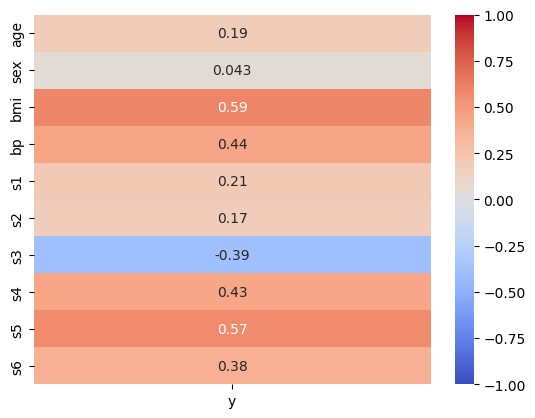

In [11]:
df = pd.concat([X_data, y_data.rename("y")], axis=1)
corr = df.corr(numeric_only=True)
sns.heatmap(corr.loc[X_data.columns, ["y"]], annot=True, vmin=-1, vmax=1, cmap="coolwarm")
plt.show()

## The Shapley value for the target, using as characteristic function the linear correlation R²

In [12]:
def calc_shapley_values(x, cf_dict):
    """
    Returns the shapley values for features x, given a
    dictionary cf_dict containing the characteristic function values.
    """

    players = list(range(x.shape[1]))
    shapley_values = []
    for _player in players:
        shapley_values.append(calc_shapley_value(_player, players, cf_dict))
    return shapley_values

def sort_shapley_values(values, features):
    return zip(*sorted(zip(values, features), reverse=True))

def flatten(tup):
    """
    Flatten any nested tuple
    """
    if len(tup) < 1:
        return tup
    if isinstance(tup[0], tuple):
        return flatten(tup[0]) + flatten(tup[1:])
    return tup[:1] + flatten(tup[1:])

def make_cf_dict(x, y, characteristic_function):
    """
    Creates dictionary with values of the characteristic function for each
    combination of the players.
    """
    cf_dict = {}
    num_players = x.shape[1]
    players = list(range(num_players))
    coalition_sizes = list(range(num_players+1))

    for _size in coalition_sizes:
        coalitions_of_size_s = list(combinations(players, _size))
        for _coalition in coalitions_of_size_s:
            _coalition = tuple(sorted(flatten(_coalition)))
            cf_dict[_coalition] = characteristic_function(x, y, _coalition)

    return cf_dict

def characteristic_function_r2(x, y, coalition):
    """
    Returns the coefficient of determination between the indices of x indicated in coalition and y
    Input:
        x, numpy array shape (#samples, #features)
        y, numpy array shape (#samples, )
        coalition, tuple of indices of features to include
    """
    if len(coalition)==0:
        return 0.0
    x = x[:, coalition]

    # --- Coefficient of determination, R2
    det_C_xy = np.linalg.det(np.corrcoef(x.T, y))
    if len(coalition)==1:
        det_C_x = 1
    else:
        det_C_x = np.linalg.det(np.corrcoef(x.T))

    return (1 - det_C_xy/det_C_x)

In [13]:
cf_dict_R2 = make_cf_dict(X_data.to_numpy(), y_data.to_numpy(), characteristic_function_r2)
print(len(cf_dict_R2))
print(2**len(features))

1024
1024


In [14]:
shapley_values = calc_shapley_values(X_data.to_numpy(), cf_dict_R2)

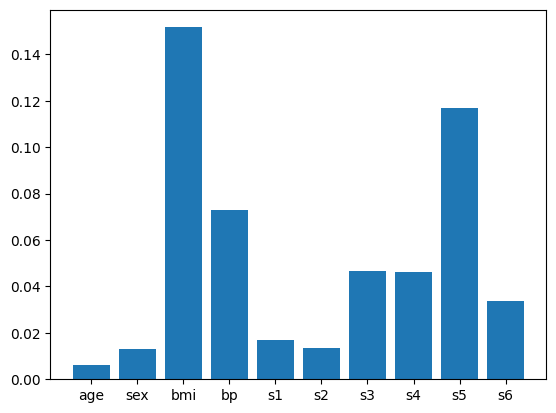

In [15]:
plt.bar(range(len(shapley_values)), shapley_values)
plt.xticks(range(len(shapley_values)), features)
plt.show()

In [16]:
print("Sum of the Shapley values: ", sum(shapley_values))
print("Value of the grand coalition: ", cf_dict_R2[list(cf_dict_R2.keys())[-1]])

Sum of the Shapley values:  0.5177484222203486
Value of the grand coalition:  0.5177484222203484


## The Shapley value for the target, using as characteristic function the distance correlation

In [17]:
def characteristic_function_dcor(x, y, coalition):
    if len(coalition)==0:
        return 0.0

    x = x[:, coalition]

    return dcor.distance_correlation(x,y)

In [18]:
cf_dict_dcor = make_cf_dict(X_data.to_numpy(), y_data.to_numpy(), characteristic_function_dcor)
shapley_values_dcor = calc_shapley_values(X_data, cf_dict_dcor)

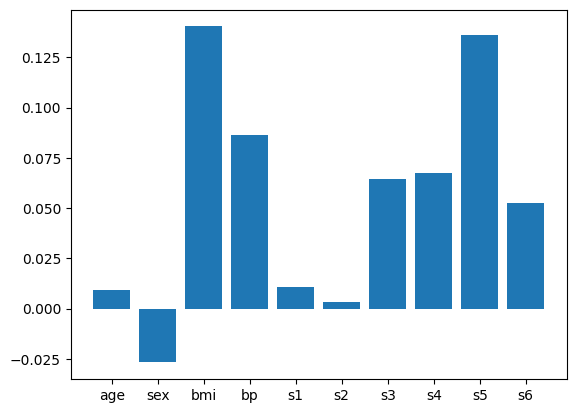

In [19]:
plt.bar(range(len(shapley_values_dcor)), shapley_values_dcor)
plt.xticks(range(len(shapley_values_dcor)), features)
plt.show()

In [20]:
_, sorted_features = sort_shapley_values(shapley_values, features)
print(sorted_features)
_, sorted_features_dcor = sort_shapley_values(shapley_values_dcor, features)
print(sorted_features_dcor)

('bmi', 's5', 'bp', 's3', 's4', 's6', 's1', 's2', 'sex', 'age')
('bmi', 's5', 'bp', 's4', 's3', 's6', 's1', 'age', 's2', 'sex')


# Shapley values for a model

### Train and evaluate regressor

In [21]:
x_train, x_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.33, random_state=42)

regressor = xgboost.XGBRegressor()
regressor.fit(x_train, y_train);

In [22]:
y_pred = regressor.predict(x_test)

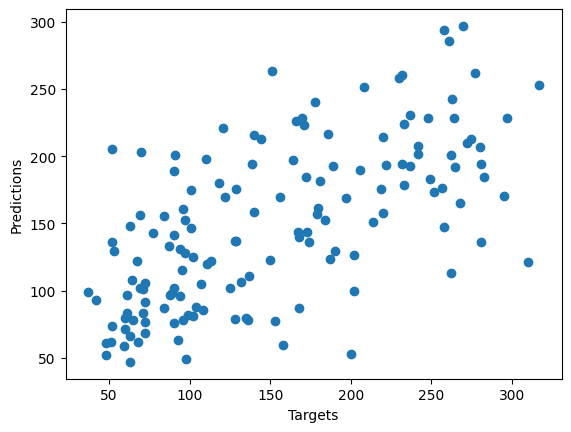

In [23]:
plt.scatter(y_test, y_pred)
plt.xlabel("Targets")
plt.ylabel("Predictions")
plt.show()

### Compare Shapley values for target and predictions

In [24]:
cf_dict_dcor_targets = make_cf_dict(x_test.to_numpy(), y_test.to_numpy(), characteristic_function_dcor)
shapley_values_targets = calc_shapley_values(x_test.to_numpy(), cf_dict_dcor_targets)

In [25]:
cf_dict_dcor_preds = make_cf_dict(x_test.to_numpy(), np.array(y_pred), characteristic_function_dcor)
shapley_values_preds = calc_shapley_values(x_test.to_numpy(), cf_dict_dcor_preds)

/usr/local/lib/python3.12/dist-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float64, 1d, C), array(float32, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(


In [26]:
def plot_shapley_comparison(values_0, values_1,feature_names=None, nametags=[0,1]):
    assert len(values_0) == len(values_1)
    num = range(1,len(values_0)+1)
    colors = ["blue", "pink"]

    for _n, _values in enumerate([values_0, values_1]):
        _col = colors[_n]
        plt.scatter(num,_values,c=_col,marker='s',alpha=0.7,label=f"Shapley values {nametags[_n]}")

    plt.ylabel("Shapley values")
    plt.legend()
    if feature_names is not None:
        ax = plt.gca()
        ax.set_xticks(num)
        ax.set_xticklabels(feature_names,rotation=45)
    plt.show()

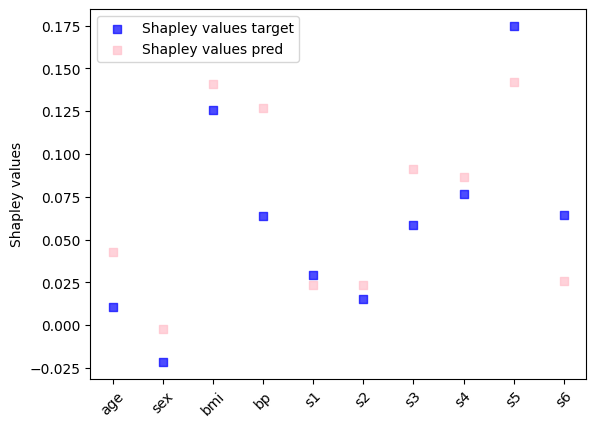

In [27]:
plot_shapley_comparison(shapley_values_targets, shapley_values_preds, features, ["target", "pred"])

In [2]:
import numpy as np
import os
import pandas as pd
import shap
import xgboost
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_diabetes
shap.initjs() # Don't worry if this doesn't work for you. Comment it out and carry on

# conda install pytorch::pytorch
# conda install pytorch::torchvision 
import torch
from torch import optim, nn
from torchvision import transforms, datasets
import torch.nn.functional as F

# Tabular data

## Data and model

In the diabetes dataset, each y value reflects how much a patient’s condition progressed after a year

In [3]:
X_data, y_data = load_diabetes(scaled=False, as_frame=True, return_X_y=True)
features = X_data.columns.to_numpy()
features

array(['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6'],
      dtype=object)

In [4]:
# I also love np arrays, but keep the dataframe structure if you want feature names on your SHAP plot
x_train, x_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.33, random_state=42)

In [5]:
regressor = xgboost.XGBRegressor()
regressor.fit(x_train, y_train);

## SHAP explainer and plot

Initialise explainer on the model, and (for now) specify a background data set.
This causes SHAP to estimate the expectation by marginalising missing features independently (using the background data), thus breaking empirical feature correlations

In [6]:
explainer = shap.TreeExplainer(regressor, data=x_train)
shap_values = explainer.shap_values(x_test)

First, make the typical SHAP plot. 
Remember from yesterday's Shapley values that bmi was important, while age was (up to third) least important

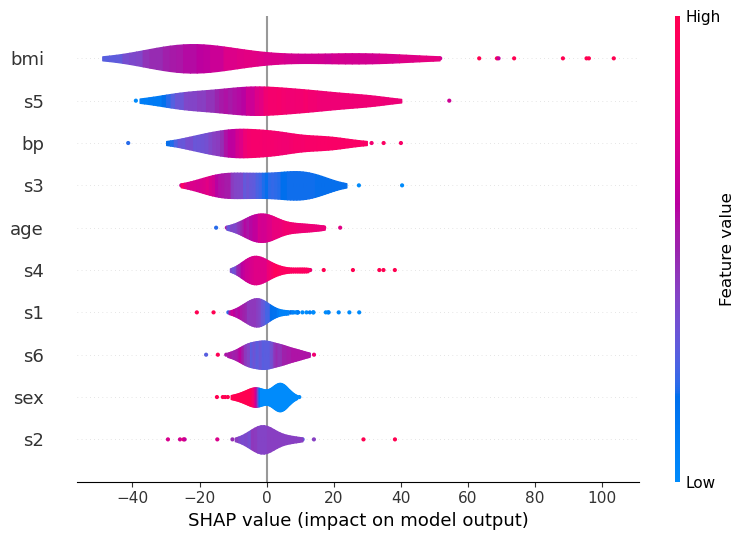

In [7]:
shap.summary_plot(shap_values, x_test, plot_type="violin")

Let's look closer at a single instance and use SHAP to explain the prediction

In [10]:
y_pred = regressor.predict(x_test)
index = 2
print("Mean BMI in test data:", np.mean(x_test.bmi))
print("Mean prediction on test data:", np.mean(y_pred))
print("Prediction on our data point:", y_pred[index])
print("Data point:")
print(x_test.iloc[index])

shap.force_plot(explainer.expected_value, shap_values[index,:], x_test.iloc[index,:])

Mean BMI in test data: 26.043150684931508
Mean prediction on test data: 149.2698
Prediction on our data point: 126.554016
Data point:
age     66.0000
sex      2.0000
bmi     26.0000
bp      91.0000
s1     264.0000
s2     146.6000
s3      65.0000
s4       4.0000
s5       5.5683
s6      87.0000
Name: 72, dtype: float64


In [23]:
print(explainer.expected_value)
print(sum(shap_values[index, :]))
print(regressor.predict(x_test)[index])
print(explainer.expected_value + sum(shap_values[index, :]))

154.44574596805717
-27.891726560560564
126.554016
126.55401940749661


In [24]:
print("Base value + sum of the SHAP values=", explainer.expected_value + sum(shap_values[index,:]))

Base value + sum of the SHAP values= 126.55401940749661


Remember that the base value represents the expected model prediction without any feature values, so the mean prediction on the background data (in our case the training data). Check if this is the case:

In [25]:
base = explainer.expected_value
mean_pred = regressor.predict(x_train).mean()
mean_y = y_train.mean()
print("Base value:", base, "\nMean prediction on training data:", mean_pred)

Base value: 154.44574596805717 
Mean prediction on training data: 151.98286


The two values are not exactly equal because the base value is estimated assuming feature independence.

If we instead let SHAP use the tree to estimate this value, it aligns more closely with the actual prediction on the test data.

In [26]:
explainer = shap.TreeExplainer(regressor, feature_perturbation="tree_path_dependent")
shap_values = explainer.shap_values(x_test)
base = explainer.expected_value
mean_pred = regressor.predict(x_train).mean()
print("Base value:", base, "\nMean prediction on training data:", mean_pred)

Base value: 151.98288 
Mean prediction on training data: 151.98286


# MNIST

In [27]:
batch_size = 64

train_loader = torch.utils.data.DataLoader(
    datasets.MNIST("mnist_data",
        train=True,
        download=True,
        transform=transforms.Compose([transforms.ToTensor()]),
    ),
    batch_size=batch_size,
    shuffle=True,
)

test_loader = torch.utils.data.DataLoader(
    datasets.MNIST("mnist_data", 
        train=False, 
        transform=transforms.Compose([transforms.ToTensor()])),
    batch_size=batch_size,
    shuffle=True,
)

B (Batch size): 64,

C (Channels): 1,

H (Height): 28,

W (Width): 28

In [28]:
# This cell is just for understanding the data loader objects
imgs, lbls = next(iter(test_loader))
print(imgs.shape)  # torch.Size([B, C, H, W])
print(lbls.shape)  # torch.Size([B])

torch.Size([64, 1, 28, 28])
torch.Size([64])


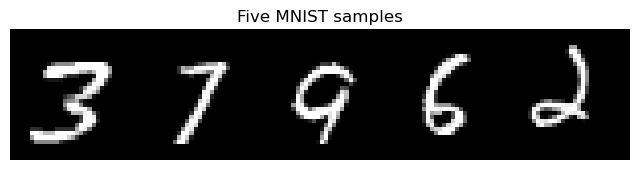

In [29]:
# This cell is just for looking at some of the images
from torchvision.utils import make_grid
imgs5 = imgs[:5]

# Make a grid and plot
grid = make_grid(imgs5, nrow=5, padding=2)
plt.figure(figsize=(8, 2))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap="gray")
plt.axis("off")
plt.title("Five MNIST samples")
plt.show()

### Train/load and test a simple pytorch model

In [30]:
num_epochs = 5
device = torch.device("cpu")

class Net(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 10, kernel_size=5),
            nn.MaxPool2d(2),
            nn.ReLU(),
            nn.Conv2d(10, 20, kernel_size=5),
            nn.Dropout(),
            nn.MaxPool2d(2),
            nn.ReLU(),
        )
        self.fc_layers = nn.Sequential(
            nn.Linear(320, 50),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(50, 10),
            nn.Softmax(dim=1),
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(-1, 320)
        x = self.fc_layers(x)
        return x


def train(model, device, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output.log(), target)
        loss.backward()
        optimizer.step()
        if batch_idx % 100 == 0:
            print(
                f"Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)}"
                f" ({100.0 * batch_idx / len(train_loader):.0f}%)]"
                f"\tLoss: {loss.item():.6f}"
            )


def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output.log(), target).item()  # sum up batch loss
            pred = output.max(1, keepdim=True)[1]  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)
    print(
        f"\nTest set: Average loss: {test_loss:.4f},"
        f" Accuracy: {correct}/{len(test_loader.dataset)}"
        f" ({100.0 * correct / len(test_loader.dataset):.0f}%)\n"
    )

model = Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.5)

model_file = "mnist_cnn.pt"

if os.path.isfile(model_file):
    print(f"Found model file {model_file}. Loading...")
    state = torch.load(model_file, map_location=device, weights_only=True)
    model.load_state_dict(state, strict=True)
    test(model, device, test_loader)

else:
    print(f"Found no model saved as {model_file}. Training...")
    for epoch in range(1, num_epochs + 1):
        train(model, device, train_loader, optimizer, epoch)
        torch.save(model.state_dict(), model_file)
        test(model, device, test_loader)


Found model file mnist_cnn.pt. Loading...

Test set: Average loss: 0.0015, Accuracy: 9751/10000 (98%)



Use the model to predict on test data

Label: 1
Prediction: 1
Probabilities: [0.   0.99 0.   0.   0.   0.   0.   0.   0.   0.  ]


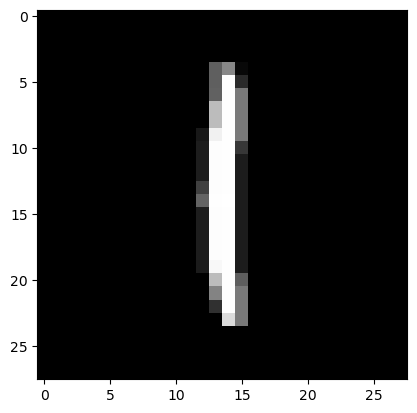

In [31]:
index = 2
model.eval()
with torch.no_grad():
    images, labels = next(iter(test_loader))
    x = images[index-1:index].to(device)
    y = labels[index-1].to(device)

    output = model(x)
    pred = output.argmax(dim=1).item()

print("Label:", y.item())
print("Prediction:", pred)
print(f"Probabilities: {np.round(output.numpy()[0],2)}")

plt.imshow(x.squeeze(), cmap="gray")
plt.show()

### SHAP

Build a small background set (reference distribution)

In [32]:
# Use ~50–200 images to keep it fast
background, _ = next(iter(train_loader))
background = background[:50].to(device)   # [50, 1, 28, 28]
background.shape

torch.Size([50, 1, 28, 28])

 Create the explainer

In [33]:
explainer = shap.DeepExplainer(model, background)

Pick a few samples to explain

In [39]:
test_samples, test_labels = next(iter(test_loader))
N = test_samples.size(0)
idx = torch.randperm(N)[:5]
test_samples = test_samples[idx]          # [5, 1, 28, 28]
test_labels = test_labels[idx]
test_samples.shape

torch.Size([5, 1, 28, 28])

Compute SHAP values

Returns a list with one array per data point: shap_values[data_index].shape == [1, 28, 28, 10]

In [40]:
shap_values = explainer.shap_values(test_samples)
shap_values[0].shape

(1, 28, 28, 10)

For the plot, we call image_plot(shap_values, pixel_values). This function needs input as:

shap_values: [numpy.array:]:
    List of numpy arrays of SHAP values. Each array has the shape [samples, W, H, C], and length equal to the number of model outputs.

pixel_values: numpy.array:
    Matrix of pixel values [samples, W, H, C] for each image. It should be the same shape as each array in the shap_values list of arrays.

In [41]:
shap_numpy = list(np.transpose(shap_values, (4, 0, 2, 3, 1)))
test_numpy = np.swapaxes(np.swapaxes(test_samples.numpy(), 1, -1), 1, 2)
print(len(shap_numpy))     # 10
print(shap_numpy[0].shape) # (5, 28, 28, 1)
print(test_numpy.shape)    # (5, 28, 28, 1)

10
(5, 28, 28, 1)
(5, 28, 28, 1)


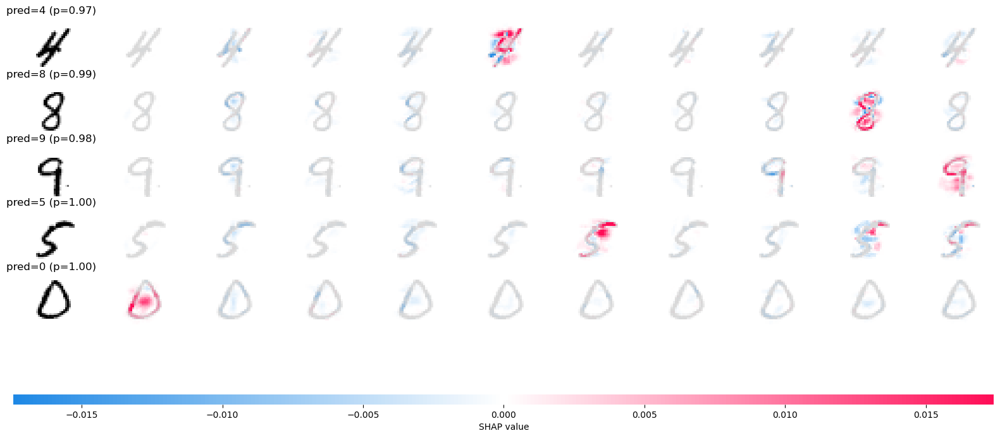

In [42]:
probs = model(test_samples).detach().numpy()      # [N,10]
pred_cls = probs.argmax(axis=1)
row_labels = [f"pred={int(pred_cls[i])} (p={probs[i, pred_cls[i]]:.2f})" for i in range(len(pred_cls))]

shap.image_plot(shap_numpy, -test_numpy, true_labels=row_labels)

The shape of the explainer.expected value corresponds to the number of classes. There is one expected prediction = baseline per class

In [43]:
explainer.expected_value

array([0.02032737, 0.1851374 , 0.08006676, 0.18173948, 0.07525377,
       0.06778049, 0.06224072, 0.11633369, 0.08466233, 0.12645797],
      dtype=float32)

In [44]:
sum(explainer.expected_value)

np.float32(0.99999994)